<img src='https://gitlab.eumetsat.int/eumetlab/oceans/ocean-training/tools/frameworks/-/raw/main/img/Standard_banner.png' align='right' width='100%'/>

# Notebook for the LA fire in January 2025

In this following Notebook I'm going to show you my research and work what I've done in the Schülerpraktikum. 
Have fun!!!

<div class="alert alert-block alert-light">

## <a id='section1'></a>1. Code Sentinel3B

</div>

In [1]:
import os
import sys
import json
import time
import base64
from IPython.core.display import HTML

import requests
import warnings
warnings.filterwarnings('ignore')

In [2]:
import hda

In [3]:
c = hda.Client()

In [5]:
query = {
  "dataset_id": "EO:EUM:DAT:SENTINEL-3:OL_1_EFR___",
  "publication": "2021-12-20T09:47:09.915Z",
  "startdate": "2025-01-10T00:00:00.000Z",
  "enddate": "2025-01-10T23:59:59.999Z",
  "bbox": [
    -119.14022475808868,
    33.23690414000709,
    -117.31755977866815,
    34.47733442408052
  ],
  "itemsPerPage": 200,
  "startIndex": 0
}

In [6]:
matches = c.search(query)
matches.download()

  0%|          | 268k/772M [00:00<04:56, 2.73MB/s]
  0%|          | 2.93M/772M [00:00<00:45, 17.5MB/s]
  1%|▏         | 11.2M/772M [00:00<00:16, 49.1MB/s]
  2%|▏         | 15.9M/772M [00:00<00:18, 43.2MB/s]
  3%|▎         | 20.3M/772M [00:00<00:17, 44.2MB/s]
  3%|▎         | 24.6M/772M [00:00<00:18, 43.4MB/s]
  4%|▍         | 29.0M/772M [00:00<00:17, 44.4MB/s]
%|▏         | 17.8M/773M [00:00<00:23, 34.2MB/s]
  4%|▍         | 33.3M/772M [00:00<00:18, 42.0MB/s]
  5%|▍         | 37.4M/772M [00:00<00:19, 40.5MB/s]
  5%|▌         | 41.2M/772M [00:01<00:19, 39.6MB/s]
  6%|▌         | 45.0M/772M [00:01<00:20, 37.8MB/s]
  6%|▋         | 48.7M/772M [00:01<00:21, 35.7MB/s]
  7%|▋         | 52.9M/772M [00:01<00:19, 38.0MB/s]
  8%|▊         | 61.3M/772M [00:01<00:18, 41.1MB/s]
  8%|▊         | 65.5M/772M [00:01<00:17, 41.9MB/s]
  9%|▉         | 70.0M/772M [00:01<00:16, 43.4MB/s]
 10%|▉         | 74.9M/772M [00:01<00:15, 46.0MB/s]
 10%|█         | 79.9M/772M [00:02<00:15, 47.8MB/s]
 11%|█         |

In [4]:
# library imports
import cartopy.crs as ccrs          # a library that support mapping
import glob                         # a library that aids in searching for files
import matplotlib.pyplot as plt     # a library that support plotting
import matplotlib.ticker as mticker # a library that extends plotting support
import numpy as np                  # a library that provides support for array-based mathematics
import os                           # a library that allows us access to basic operating system commands
import warnings                     # a library that helps us manage warnings
import xarray as xr                 # a library that supports the use of multi-dimensional arrays in Python
import eumartools                   # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

In [8]:
import zipfile
import os
 
# Path to the zip file and extraction directory
zip_file_path = "S3B_OL_1_EFR____20250110T175832_20250110T180132_20250111T205534_0180_102_041_2340_MAR_O_NT_004.SEN3.zip"
extract_to_path = "/home/jovyan/Result"
 
# Ensure the extraction directory exists
os.makedirs(extract_to_path, exist_ok=True)
 
# Open and extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
 
print(f"Files extracted to: {extract_to_path}")

Files extracted to: /home/jovyan/Result


In [9]:
import os
os.getcwd()

'/home/jovyan'

In [10]:
# selecting SAFE directory
SAFE_directory = os.path.join(os.getcwd(), 'Result', 
    'S3B_OL_1_EFR____20250110T175832_20250110T180132_20250111T205534_0180_102_041_2340_MAR_O_NT_004.SEN3')

In [11]:
grid_reduce = 3
band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'Oa*.nc')))
band_dict = {}
bands_needed = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 17]

for band_var in band_vars:
    band_num = int(band_var.split('_')[0][2:])
    if band_num not in bands_needed:
        print(f"Skipping: {band_var}, as we don't need it for now")
    else:
        print(f"Reading:  {band_var}")
        band_dict[band_var] = band_vars[band_var].data[::grid_reduce,::grid_reduce]

band_vars.close()

Reading:  Oa01_radiance
Reading:  Oa01_radiance_unc
Reading:  Oa02_radiance
Reading:  Oa02_radiance_unc
Reading:  Oa03_radiance
Reading:  Oa03_radiance_unc
Reading:  Oa04_radiance
Reading:  Oa04_radiance_unc
Reading:  Oa05_radiance
Reading:  Oa05_radiance_unc
Reading:  Oa06_radiance
Reading:  Oa06_radiance_unc
Reading:  Oa07_radiance
Reading:  Oa07_radiance_unc
Reading:  Oa08_radiance
Reading:  Oa08_radiance_unc
Reading:  Oa09_radiance
Reading:  Oa09_radiance_unc
Reading:  Oa10_radiance
Reading:  Oa10_radiance_unc
Reading:  Oa11_radiance
Reading:  Oa11_radiance_unc
Skipping: Oa12_radiance, as we don't need it for now
Skipping: Oa12_radiance_unc, as we don't need it for now
Skipping: Oa13_radiance, as we don't need it for now
Skipping: Oa13_radiance_unc, as we don't need it for now
Skipping: Oa14_radiance, as we don't need it for now
Skipping: Oa14_radiance_unc, as we don't need it for now
Skipping: Oa15_radiance, as we don't need it for now
Skipping: Oa15_radiance_unc, as we don't need

In [12]:
# Natural colour single band
red_recipe = band_dict['Oa08_radiance']
green_recipe = band_dict['Oa06_radiance']
blue_recipe = band_dict['Oa02_radiance']

rgb_nat = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_nat_norm = eumartools.normalise_image(rgb_nat)

In [13]:
# Tristimulus
red_recipe = np.log10(1.0 + 0.01 * band_dict['Oa01_radiance'] + 0.09 * band_dict['Oa02_radiance'] 
                      + 0.35 * band_dict['Oa03_radiance'] + 0.04 * band_dict['Oa04_radiance'] 
                      + 0.01 * band_dict['Oa05_radiance'] + 0.59 * band_dict['Oa06_radiance'] 
                      + 0.85 * band_dict['Oa07_radiance'] + 0.12 * band_dict['Oa08_radiance'] 
                      + 0.07 * band_dict['Oa09_radiance'] + 0.04 * band_dict['Oa10_radiance'])
green_recipe = np.log10(1.0 + 0.26 * band_dict['Oa03_radiance'] + 0.21 * band_dict['Oa04_radiance'] 
                        + 0.50 * band_dict['Oa05_radiance'] + band_dict['Oa06_radiance'] 
                        + 0.38 * band_dict['Oa07_radiance'] + 0.04 * band_dict['Oa08_radiance'] 
                        + 0.03 * band_dict['Oa09_radiance'] + 0.02 * band_dict['Oa10_radiance'])
blue_recipe = np.log10(1.0 + 0.07 * band_dict['Oa01_radiance'] + 0.28 * band_dict['Oa02_radiance'] 
                       + 1.77 * band_dict['Oa03_radiance'] + 0.47 * band_dict['Oa04_radiance'] 
                       + 0.16 * band_dict['Oa05_radiance'])

rgb_tri = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_tri_norm = eumartools.normalise_image(rgb_tri)

In [14]:
# Natural colour broad band, log scaled
red_recipe = 0.16666 * band_dict['Oa09_radiance'] + 0.66666 * band_dict['Oa09_radiance'] \
             + 0.08333 * band_dict['Oa10_radiance'] + 0.08333 * band_dict['Oa11_radiance']
green_recipe = 0.16666 *  band_dict['Oa05_radiance'] + 0.66666 *  band_dict['Oa06_radiance'] \
               + 0.16666 *  band_dict['Oa07_radiance']
blue_recipe = 0.16666 *  band_dict['Oa02_radiance'] + 0.66666 *  band_dict['Oa03_radiance'] \
               + 0.16666 *  band_dict['Oa04_radiance']

rgb_log = np.dstack(((np.log10(red_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(green_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(blue_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795))
                     
rgb_log_norm = eumartools.normalise_image(rgb_log)

In [15]:
# False colour
red_recipe = band_dict['Oa17_radiance']
green_recipe = band_dict['Oa06_radiance']
blue_recipe = band_dict['Oa02_radiance']

rgb_fls = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_fls_norm = eumartools.normalise_image(rgb_fls)

<div class="alert alert-info" role="alert">

## <a id='section1'></a>2. RGB Pictures
</div>

Here you can see LA with different farbfilters. The smoke isn't shown that good on these 4 pictures.

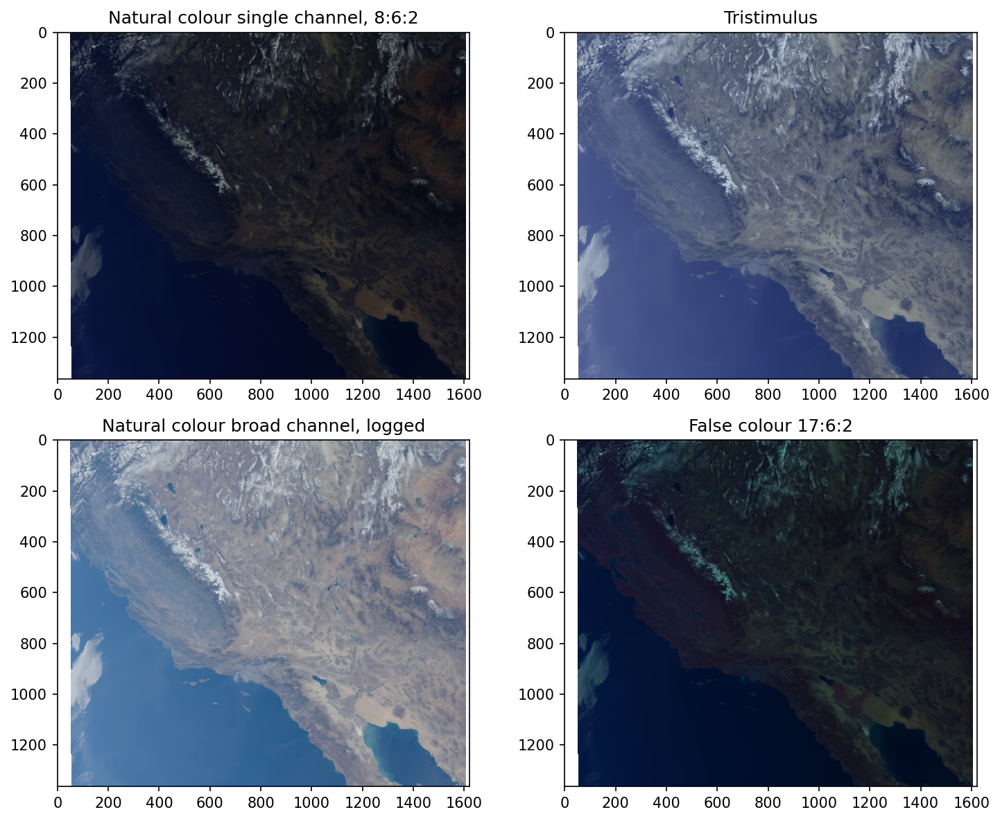

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

axs[0,0].imshow(rgb_nat_norm); axs[0,0].title.set_text('Natural colour single channel, 8:6:2')
axs[0,1].imshow(rgb_tri_norm); axs[0,1].title.set_text('Tristimulus')
axs[1,0].imshow(rgb_log_norm); axs[1,0].title.set_text('Natural colour broad channel, logged')
axs[1,1].imshow(rgb_fls_norm); axs[1,1].title.set_text('False colour 17:6:2')

plt.tight_layout()

In [18]:
rgb_log_norm_unhitch = eumartools.normalise_image(rgb_log, unhitch=True)
rgb_log_norm_trunc = eumartools.truncate_image(rgb_log_norm, min_percentile=5.0, max_percentile=95.0)
rgb_log_norm_hist = eumartools.histogram_image(rgb_log_norm, nbins=512)

In the first three pictures, the smoke is not that clear to see for everyone but on the fourth one in the bottom corner right, the smoke is clear to see.

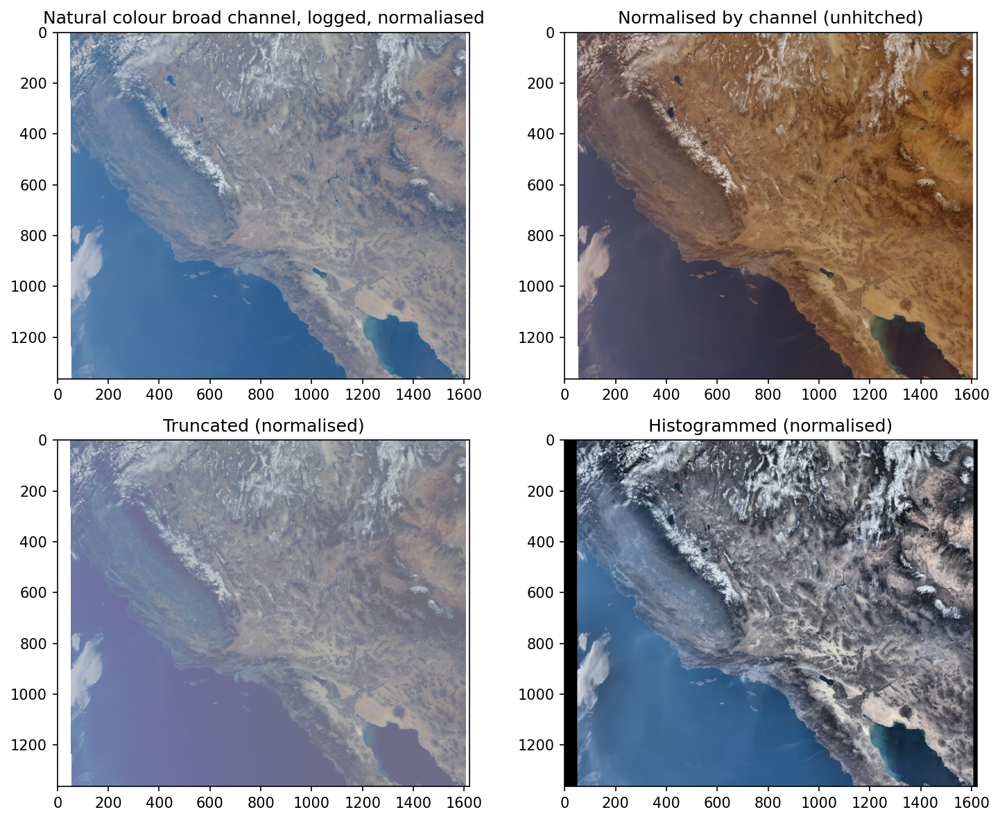

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

axs[0,0].imshow(rgb_log_norm); axs[0,0].title.set_text('Natural colour broad channel, logged, normaliased')
axs[0,1].imshow(rgb_log_norm_unhitch); axs[0,1].title.set_text('Normalised by channel (unhitched)')
axs[1,0].imshow(rgb_log_norm_trunc); axs[1,0].title.set_text('Truncated (normalised)')
axs[1,1].imshow(rgb_log_norm_hist); axs[1,1].title.set_text('Histogrammed (normalised)')

plt.tight_layout()

<div class="alert alert-warning" role="alert">

## <a id='section1'></a>3. Geographical Maps
</div>



In [20]:
geo_file = os.path.join(SAFE_directory,'geo_coordinates.nc')
geo_vars = xr.open_dataset(geo_file)
lon = geo_vars.longitude.data[::grid_reduce,::grid_reduce]
lat = geo_vars.latitude.data[::grid_reduce,::grid_reduce]
geo_vars.close()

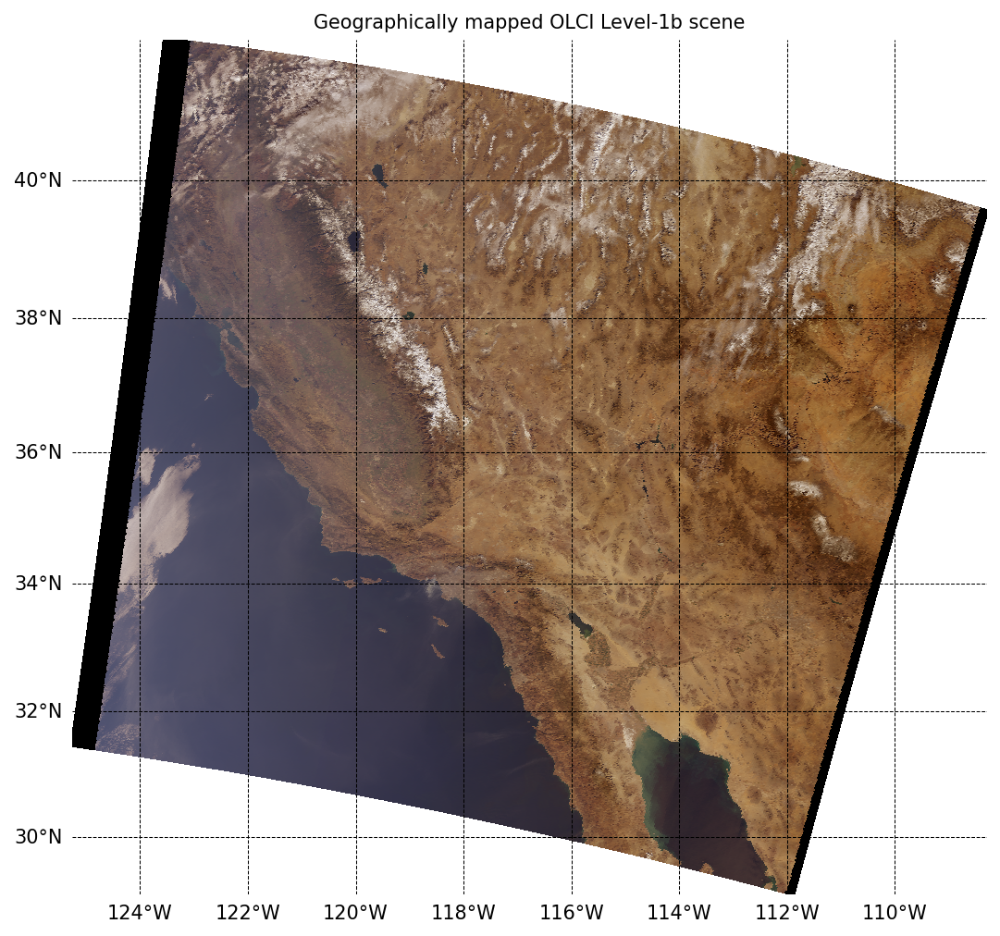

In [21]:
fig = plt.figure(figsize=(10, 8), dpi=150)
m = plt.subplot(projection=ccrs.Mercator())

# make the colour map
colorArray = np.array(rgb_log_norm_unhitch)
colorTuple = colorArray.reshape((colorArray.shape[0] * colorArray.shape[1]), 3)
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1)

# make the map
m.pcolormesh(lon, lat, lon, color=colorTuple, edgecolors=None, transform=ccrs.PlateCarree())

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='k', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 2))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 2))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'size': 10, 'color': 'black'}
g1.ylabel_style = {'size': 10, 'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

plt.title('Geographically mapped OLCI Level-1b scene', fontsize=10)
plt.savefig('1_4_OLCI_RGB.png', bbox_inches='tight')
plt.show()

In [22]:
# Enter your solution here

In [23]:
from matplotlib.patches import Circle
import matplotlib.cm as cm

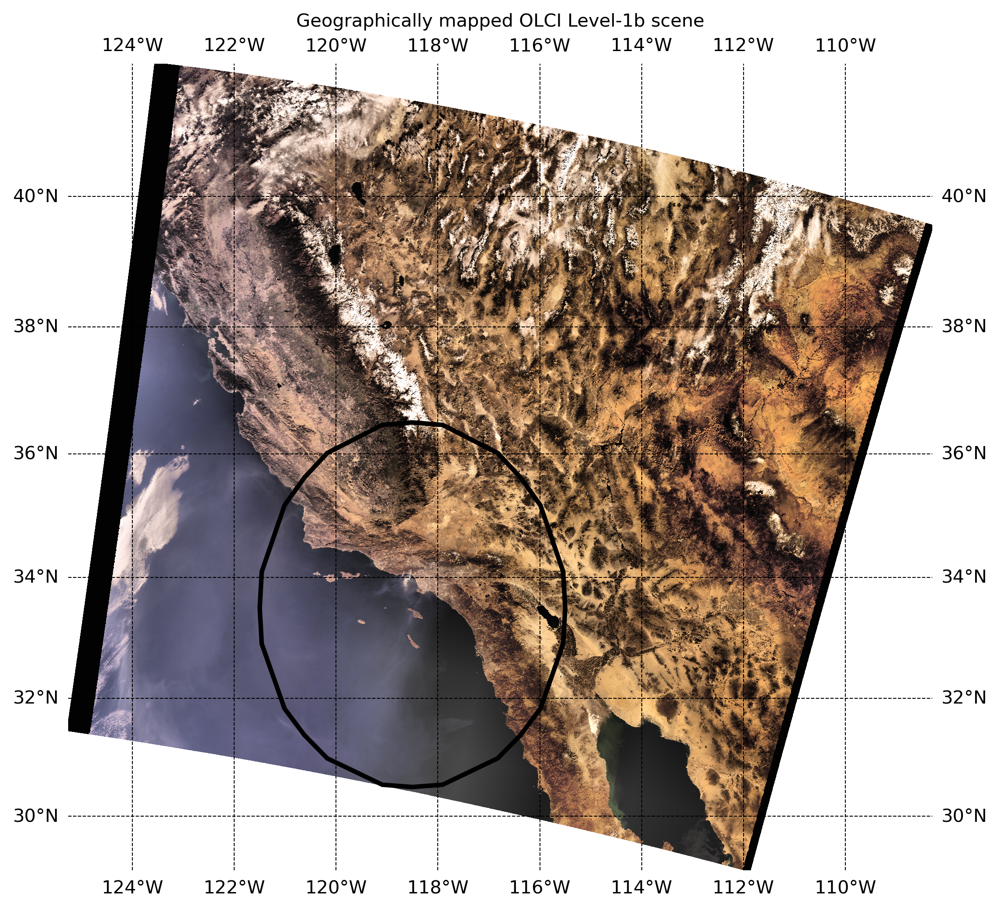

In [24]:
# first normalise by channel
rgb_log_norm_unhitch = eumartools.normalise_image(rgb_log, unhitch=True)
# then remove the outliers from the unhitched image
rgb_log_norm_unhitch_trunc = eumartools.truncate_image(rgb_log_norm_unhitch)
# then histogram the truncate image
rgb_log_final = eumartools.histogram_image(rgb_log_norm_unhitch_trunc, nbins=512)

# make the plot
fig = plt.figure(figsize=(10, 8), dpi=300)
m = plt.subplot(projection=ccrs.Mercator())

# make the colour map
colorArray = np.array(rgb_log_final)
colorTuple = colorArray.reshape((colorArray.shape[0] * colorArray.shape[1]), 3)
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1)

# make the map
m.pcolormesh(lon, lat, lon, color=colorTuple, edgecolors=None, transform=ccrs.PlateCarree())

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='k', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 2))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 2))
g1.xlabels_top = False
g1.ylabels_right = False
g1.xlabel_style = {'size': 10, 'color': 'black'}
g1.ylabel_style = {'size': 10, 'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

# Kreis hinzufügen (transformiert auf die geografischen Koordinaten)
kreis = Circle(
    (-118.5, 33.5), radius=3, linewidth=2.5, fill=False, transform=ccrs.PlateCarree()
)
m.add_patch(kreis)
plt.title('Geographically mapped OLCI Level-1b scene', fontsize=10)
plt.show()


<div class="alert alert-success" role="alert">

# <a id='section3'></a>4. Los Angeles Wildfire and Its Environmental Impact
</div>

## On the map of <a href='https://www.wekeo.eu/data?view=viewer&t=1736484628538&z=0&center=-118.42365%2C33.85098&zoom=17.58&layers=W3siaWQiOiJjMCIsInJlcGxhY2VtZW50Q29sb3JNYXBJZCI6bnVsbCwidmFsdWVNaW4iOm51bGwsInZhbHVlTWF4IjpudWxsLCJsYXllcklkIjoiRU86Q0xNUzpEQVQ6Q0xNU19HTE9CQUxfTkRWSV8zMDBNX1YxXzEwREFJTFlfTkVUQ0RGL19fREVGQVVMVF9fL2NsbXNfZ2xvYmFsX25kdmlfMzAwbV92MV8xMGRhaWx5IiwiekluZGV4IjoyMH0seyJpZCI6ImMxIiwicmVwbGFjZW1lbnRDb2xvck1hcElkIjpudWxsLCJ2YWx1ZU1pbiI6bnVsbCwidmFsdWVNYXgiOm51bGwsImxheWVySWQiOiJFTzpFVU06REFUOlNFTlRJTkVMLTM6U1JfMV9TUkFfX18vX19ERUZBVUxUX18vX19ERUZBVUxUX18iLCJ6SW5kZXgiOjQwfSx7ImlkIjoiYzIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVTQTpEQVQ6U0VOVElORUwtMi9fX0RFRkFVTFRfXy8xX1RSVUVfQ09MT1IiLCJ6SW5kZXgiOjUwLCJpc0hpZGRlbiI6dHJ1ZX0seyJpZCI6ImMzIiwib3BlbkRyYXdlck5hbWUiOiJzdWJzZXR0ZXIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVVTTpEQVQ6U0VOVElORUwtMzpPTF8xX0VGUl9fXy9fX0RFRkFVTFRfXy9jb3Blcm5pY3VzOmRhaWx5X3NlbnRpbmVsM2FiX29sY2lfbDFfcmdiX2Z1bHJlcyIsInpJbmRleCI6NjB9XQ%3D%3D&crs=epsg%3A3857'>WEkeO</a> you can see the LA Fire <a href='https://www.wekeo.eu/data?view=viewer&t=1736074859828&z=0&center=-118.42365%2C33.85098&zoom=17.58&layers=W3siaWQiOiJjMCIsInJlcGxhY2VtZW50Q29sb3JNYXBJZCI6bnVsbCwidmFsdWVNaW4iOm51bGwsInZhbHVlTWF4IjpudWxsLCJsYXllcklkIjoiRU86Q0xNUzpEQVQ6Q0xNU19HTE9CQUxfTkRWSV8zMDBNX1YxXzEwREFJTFlfTkVUQ0RGL19fREVGQVVMVF9fL2NsbXNfZ2xvYmFsX25kdmlfMzAwbV92MV8xMGRhaWx5IiwiekluZGV4IjoyMH0seyJpZCI6ImMxIiwicmVwbGFjZW1lbnRDb2xvck1hcElkIjpudWxsLCJ2YWx1ZU1pbiI6bnVsbCwidmFsdWVNYXgiOm51bGwsImxheWVySWQiOiJFTzpFVU06REFUOlNFTlRJTkVMLTM6U1JfMV9TUkFfX18vX19ERUZBVUxUX18vX19ERUZBVUxUX18iLCJ6SW5kZXgiOjQwfSx7ImlkIjoiYzIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVTQTpEQVQ6U0VOVElORUwtMi9fX0RFRkFVTFRfXy8xX1RSVUVfQ09MT1IiLCJ6SW5kZXgiOjUwLCJpc0hpZGRlbiI6dHJ1ZX0seyJpZCI6ImMzIiwib3BlbkRyYXdlck5hbWUiOiJzdWJzZXR0ZXIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVVTTpEQVQ6U0VOVElORUwtMzpPTF8xX0VGUl9fXy9fX0RFRkFVTFRfXy9jb3Blcm5pY3VzOmRhaWx5X3NlbnRpbmVsM2FiX29sY2lfbDFfcmdiX2Z1bHJlcyIsInpJbmRleCI6NjB9XQ%3D%3D&crs=epsg%3A3857'>before</a> and  <a href='https://www.wekeo.eu/data?view=viewer&t=1736484628538&z=0&center=-118.42365%2C33.85098&zoom=17.58&layers=W3siaWQiOiJjMCIsInJlcGxhY2VtZW50Q29sb3JNYXBJZCI6bnVsbCwidmFsdWVNaW4iOm51bGwsInZhbHVlTWF4IjpudWxsLCJsYXllcklkIjoiRU86Q0xNUzpEQVQ6Q0xNU19HTE9CQUxfTkRWSV8zMDBNX1YxXzEwREFJTFlfTkVUQ0RGL19fREVGQVVMVF9fL2NsbXNfZ2xvYmFsX25kdmlfMzAwbV92MV8xMGRhaWx5IiwiekluZGV4IjoyMH0seyJpZCI6ImMxIiwicmVwbGFjZW1lbnRDb2xvck1hcElkIjpudWxsLCJ2YWx1ZU1pbiI6bnVsbCwidmFsdWVNYXgiOm51bGwsImxheWVySWQiOiJFTzpFVU06REFUOlNFTlRJTkVMLTM6U1JfMV9TUkFfX18vX19ERUZBVUxUX18vX19ERUZBVUxUX18iLCJ6SW5kZXgiOjQwfSx7ImlkIjoiYzIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVTQTpEQVQ6U0VOVElORUwtMi9fX0RFRkFVTFRfXy8xX1RSVUVfQ09MT1IiLCJ6SW5kZXgiOjUwLCJpc0hpZGRlbiI6dHJ1ZX0seyJpZCI6ImMzIiwib3BlbkRyYXdlck5hbWUiOiJzdWJzZXR0ZXIiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkVVTTpEQVQ6U0VOVElORUwtMzpPTF8xX0VGUl9fXy9fX0RFRkFVTFRfXy9jb3Blcm5pY3VzOmRhaWx5X3NlbnRpbmVsM2FiX29sY2lfbDFfcmdiX2Z1bHJlcyIsInpJbmRleCI6NjB9XQ%3D%3D&crs=epsg%3A3857'>during</a>. 
## Fire
These is the LA Fire wich started on 7th January 2025 in Los Angeles. It started because of an wildfire wich the wind has blown in the direction of LA. Because of the dry air and the high temperatures the fire started to spread fast. The firefighters could'nt handle the flames because they were uncontrollable.  The recent wildfire in Los Angeles, starting in January 2025, devastated thousands of acres, displaced families, and harmed the environment. Fueled by drought, high temperatures, and winds, it highlights the growing threat of climate change.

Environmental Impact:

Air Pollution: Massive CO₂ and particulate emissions worsen climate change and harm air quality.
Habitat Loss: Wildlife habitats were destroyed, threatening biodiversity.
Soil and Water Damage: Burnt landscapes lead to erosion, soil degradation, and polluted waterways.
Wildfires like this are a stark reminder of the urgent need for sustainable solutions to protect ecosystems and combat climate change.
## Smoke
The massive smoke plumes from the Los Angeles wildfire not only blanketed the city but also extended far out over the Pacific Ocean. Strong winds carried fine particles (PM2.5) and pollutants like carbon dioxide and black carbon across vast distances.

This smoke can impact marine environments by depositing soot into the ocean. Soot can alter water chemistry, potentially disrupting marine ecosystems and affecting plankton, which are crucial for ocean life and carbon absorption. Additionally, smoke haze over the ocean reduces sunlight penetration, which can harm photosynthetic marine organisms like algae.

The spread of wildfire smoke over oceans shows how far-reaching these disasters can be, affecting ecosystems far beyond the land.


<div class="alert alert-light" role="alert">

# <a id='section3'></a>5. Code Sentinel2A
</div>

In [1]:
import os
import sys
import json
import time
import base64
from IPython.core.display import HTML

import requests
import warnings
warnings.filterwarnings('ignore')

In [2]:
import hda

In [3]:
c = hda.Client()

In [7]:
query = {
  "dataset_id": "EO:ESA:DAT:SENTINEL-2",
  "bbox": [
    -118.7453585998553,
    33.99724104868417,
    -118.47467711517486,
    34.160253486540284
  ],
  "productType": "S2MSI2A",
  "startdate": "2025-01-12T00:00:00.000Z",
  "enddate": "2025-01-12T23:59:59.999Z",
  "itemsPerPage": 200,
  "startIndex": 0
}

In [29]:
matches = c.search(query)
matches.download()

In [4]:
# library imports
import cartopy.crs as ccrs          # a library that support mapping
import glob                         # a library that aids in searching for files
import matplotlib.pyplot as plt     # a library that support plotting
import matplotlib.ticker as mticker # a library that extends plotting support
import numpy as np                  # a library that provides support for array-based mathematics
import os                           # a library that allows us access to basic operating system commands
import warnings                     # a library that helps us manage warnings
import xarray as xr                 # a library that supports the use of multi-dimensional arrays in Python
import eumartools                   # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

In [9]:
import zipfile
import os
 
# Path to the zip file and extraction directory
zip_file_path = "S2A_MSIL2A_20250112T183731_N0511_R027_T11SLT_20250112T222951.SAFE.zip"
extract_to_path = "/home/jovyan/Result"
 
# Ensure the extraction directory exists
os.makedirs(extract_to_path, exist_ok=True)
 
# Open and extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
 
print(f"Files extracted to: {extract_to_path}")

Files extracted to: /home/jovyan/Result


In [5]:
import os
os.getcwd()

'/home/jovyan'

In [6]:
# selecting SAFE directory
SAFE_directory = os.path.join(os.getcwd(), 'Result', 
    'S2A_MSIL2A_20250112T183731_N0511_R027_T11SLT_20250112T222951.SAFE','GRANULE',"L2A_T11SLT_A049931_20250112T183727","IMG_DATA","R60m")

In [7]:
os.listdir (SAFE_directory)

['T11SLT_20250112T183731_B05_60m.jp2',
 'T11SLT_20250112T183731_B01_60m.jp2',
 'T11SLT_20250112T183731_B04_60m.jp2',
 'T11SLT_20250112T183731_B02_60m.jp2',
 'T11SLT_20250112T183731_B06_60m.jp2',
 'T11SLT_20250112T183731_B8A_60m.jp2',
 'T11SLT_20250112T183731_B09_60m.jp2',
 'T11SLT_20250112T183731_AOT_60m.jp2',
 'T11SLT_20250112T183731_B11_60m.jp2',
 'T11SLT_20250112T183731_WVP_60m.jp2',
 'T11SLT_20250112T183731_B03_60m.jp2',
 'T11SLT_20250112T183731_TCI_60m.jp2',
 'T11SLT_20250112T183731_B12_60m.jp2',
 'T11SLT_20250112T183731_B07_60m.jp2',
 'T11SLT_20250112T183731_SCL_60m.jp2']

<div class="alert alert-danger" role="alert">

# <a id='section3'></a>6. Before and after the fire
</div>

In [8]:
import os

import rasterio

import numpy as np

import matplotlib.pyplot as plt
 
# Band file paths (adjust based on Sentinel-2 structure)

band_paths = {

    'B4': os.path.join(SAFE_directory, "T11SLT_20250112T183731_B12_60m.jp2"),  # Replace TILE_NAME with actual tile

    'B3': os.path.join(SAFE_directory, "T11SLT_20250112T183731_B8A_60m.jp2"),

    'B2': os.path.join(SAFE_directory, "T11SLT_20250112T183731_B03_60m.jp2"),

}
 
# Load bands

bands = {}

for band, path in band_paths.items():

    with rasterio.open(path) as src:

        bands[band] = src.read(1)
 
# Stack bands in RGB order

rgb = np.stack([bands['B4'], bands['B3'], bands['B2']], axis=-1)
 
# Normalize to [0, 1] for display

rgb_normalized_after = rgb / np.percentile(rgb, 99)  # Normalize to 99th percentile to avoid outliers

rgb_normalized_after = np.clip(rgb_normalized_after, 0, 1)  # Clip values to [0, 1]

 

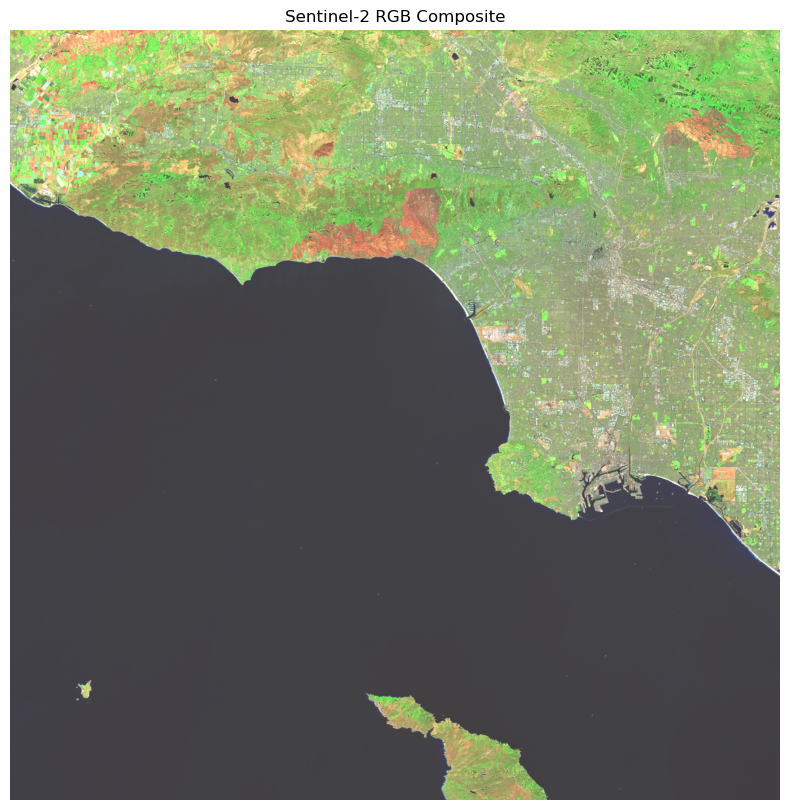

In [9]:
# Plot RGB image
plt.figure(figsize=(10, 10))
plt.imshow(rgb_normalized_after)
plt.title("Sentinel-2 RGB Composite")
plt.axis('off')
plt.show()

In [10]:
import zipfile
import os
 
# Path to the zip file and extraction directory
zip_file_path = "S2A_MSIL2A_20250102T183751_N0511_R027_T11SLT_20250102T221646.SAFE.zip"
extract_to_path = "/home/jovyan/Result"
 
# Ensure the extraction directory exists
os.makedirs(extract_to_path, exist_ok=True)
 
# Open and extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
 
print(f"Files extracted to: {extract_to_path}")

Files extracted to: /home/jovyan/Result


In [11]:
import os
os.getcwd()

'/home/jovyan'

In [12]:
# selecting SAFE directory
SAFE_directory = os.path.join(os.getcwd(), 'Result', 
    'S2A_MSIL2A_20250102T183751_N0511_R027_T11SLT_20250102T221646.SAFE','GRANULE',"L2A_T11SLT_A049788_20250102T183754","IMG_DATA","R60m")

In [13]:
os.listdir (SAFE_directory)

['T11SLT_20250102T183751_WVP_60m.jp2',
 'T11SLT_20250102T183751_TCI_60m.jp2',
 'T11SLT_20250102T183751_B12_60m.jp2',
 'T11SLT_20250102T183751_B05_60m.jp2',
 'T11SLT_20250102T183751_B09_60m.jp2',
 'T11SLT_20250102T183751_B07_60m.jp2',
 'T11SLT_20250102T183751_B04_60m.jp2',
 'T11SLT_20250102T183751_AOT_60m.jp2',
 'T11SLT_20250102T183751_B06_60m.jp2',
 'T11SLT_20250102T183751_B11_60m.jp2',
 'T11SLT_20250102T183751_SCL_60m.jp2',
 'T11SLT_20250102T183751_B03_60m.jp2',
 'T11SLT_20250102T183751_B02_60m.jp2',
 'T11SLT_20250102T183751_B8A_60m.jp2',
 'T11SLT_20250102T183751_B01_60m.jp2']

In [14]:
import os

import rasterio

import numpy as np

import matplotlib.pyplot as plt
 
# Band file paths (adjust based on Sentinel-2 structure)

band_paths = {

    'B4': os.path.join(SAFE_directory, "T11SLT_20250102T183751_B12_60m.jp2"),  # Replace TILE_NAME with actual tile      #R

    'B3': os.path.join(SAFE_directory, "T11SLT_20250102T183751_B8A_60m.jp2"),                                            #G

    'B2': os.path.join(SAFE_directory, "T11SLT_20250102T183751_B03_60m.jp2"),                                            #B

}
 
# Load bands

bands = {}

for band, path in band_paths.items():

    with rasterio.open(path) as src:

        bands[band] = src.read(1)
 
# Stack bands in RGB order

rgb = np.stack([bands['B4'], bands['B3'], bands['B2']], axis=-1)
 
# Normalize to [0, 1] for display

rgb_normalized_before = rgb / np.percentile(rgb, 99)  # Normalize to 99th percentile to avoid outliers

rgb_normalized_before = np.clip(rgb_normalized_before, 0, 1)  # Clip values to [0, 1]

 

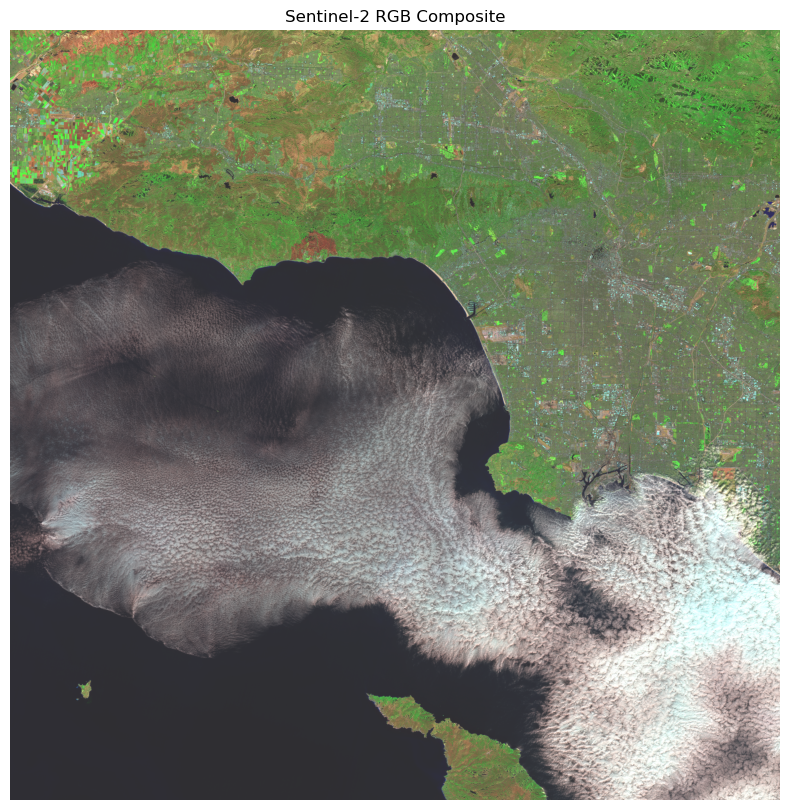

In [15]:
# Plot RGB image
plt.figure(figsize=(10, 10))
plt.imshow(rgb_normalized_before)
plt.title("Sentinel-2 RGB Composite")
plt.axis('off')
plt.show()

In [17]:
pip install jupyter-splitview

DEPRECATION: Loading egg at /opt/conda/envs/wekeolab/lib/python3.11/site-packages/eumartools_benloveday-0.0.1-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
  Using cached jupyter_splitview-0.1.2-py3-none-any.whl
  Using cached jupyter_compare_view-0.2.4-py3-none-any.whl.metadata (6.7 kB)
Using cached jupyter_compare_view-0.2.4-py3-none-any.whl (11 kB)
Note: you may need to restart the kernel to use updated packages.


In [18]:
import jupyter_compare_view

Jupyter compare_view v0.2.4



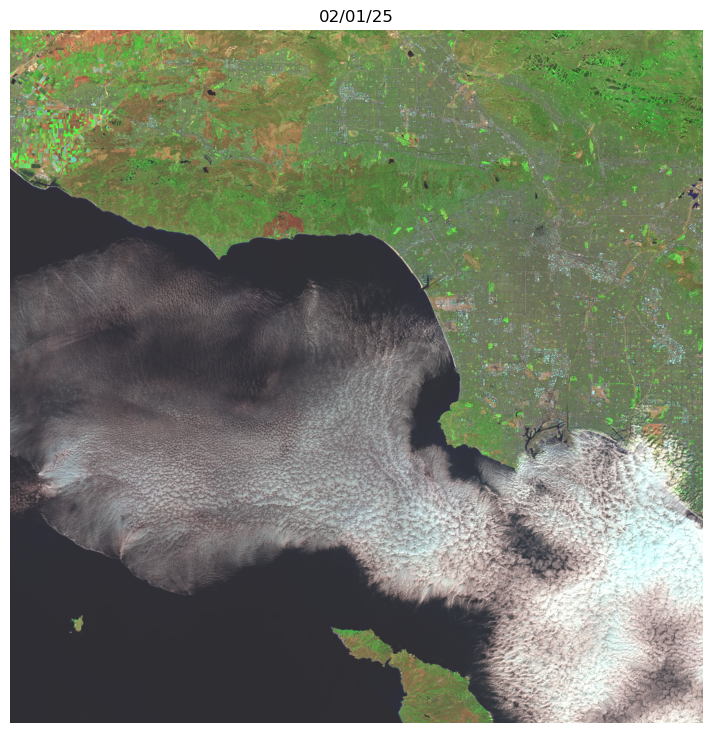
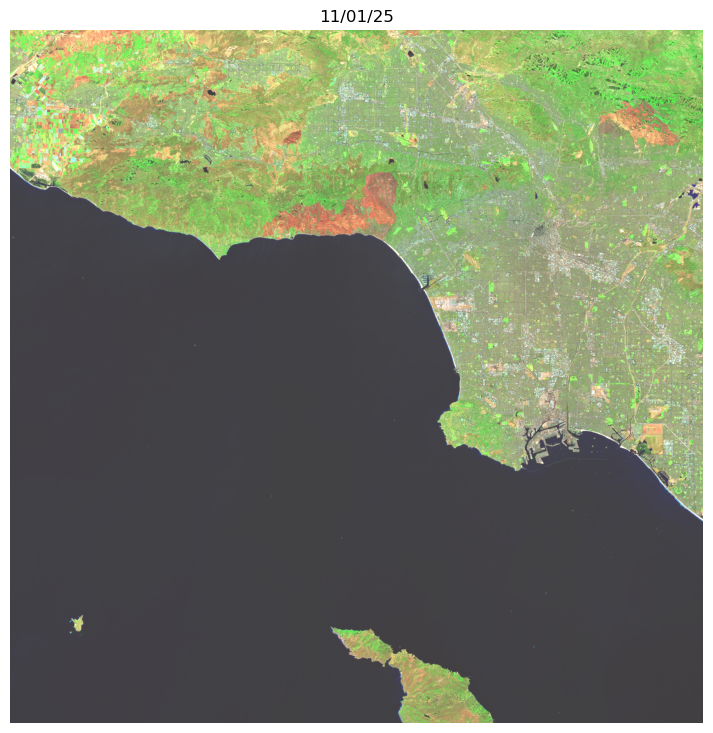

In [20]:
%%compare  
from skimage import data
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
plt.figure(figsize=(9, 9))

plt.imshow(rgb_normalized_before)
plt.title("02/01/25")
plt.axis("off")
plt.show()
plt.figure(figsize=(9, 9))

plt.imshow(rgb_normalized_after)
plt.title("11/01/25")
plt.axis("off")
plt.show()


## Before and after
In the images above, you can see the red-marked areas, which indicate the locations affected by the fire. These areas are burned, and we’ve created the perfect slider to compare the before-and-after effects of the fire. 

Why do the burned areas appear red? This is because I used bands 12, 8A, and 3 and assigned them to the RGB channels of the images. The red coloration is a result of band 8A being mapped to the green channel. 

When there is dense vegetation, band 8A records high values, which makes the ground appear green. However, in areas with little or no vegetation, the values are much lower, and the ground is displayed as red in this visualization.

# 7. Ressources

-  https://github.com/wekeo/learn-olci/blob/6d59ac66b8b6d3e4a9a9a25aa3c1fb0b61b02719/1_OLCI_introductory/1_4_OLCI_bands_imagery.ipynb
- https://chatgpt.com/c/6791fdd5-cf90-800e-870a-1b13c6e503ed
- https://medium.com/geekculture/making-a-before-after-image-slider-in-jupyter-notebook-b88723924a35
- https://www.wekeo.eu/data?view=viewer&t=1623014851764&z=499.50597500801086&center=-729.05403%2C34.1512&zoom=10.27&layers=W3siaWQiOiJjMCIsInJlcGxhY2VtZW50Q29sb3JNYXBJZCI6bnVsbCwidmFsdWVNaW4iOm51bGwsInZhbHVlTWF4IjpudWxsLCJsYXllcklkIjoiRU86TU86REFUOkdMT0JBTF9BTkFMWVNJU0ZPUkVDQVNUX1BIWV8wMDFfMDI0L2NtZW1zX21vZF9nbG9fcGh5LXNvX2FuZmNfMC4wODNkZWdfUDFELW1fMjAyNDA2L3NvIiwiekluZGV4IjoxMCwibG9nU2NhbGUiOmZhbHNlfSx7ImlkIjoiYzEiLCJyZXBsYWNlbWVudENvbG9yTWFwSWQiOm51bGwsInZhbHVlTWluIjpudWxsLCJ2YWx1ZU1heCI6bnVsbCwibGF5ZXJJZCI6IkVPOkNMTVM6REFUOkNMTVNfR0xPQkFMX05EVklfMzAwTV9WMV8xMERBSUxZX05FVENERi9fX0RFRkFVTFRfXy9jbG1zX2dsb2JhbF9uZHZpXzMwMG1fdjFfMTBkYWlseSIsInpJbmRleCI6MjB9XQ%3D%3D&crs=epsg%3A3857
- https://notebooks.prod.wekeo2.eu/notebook/ai4EM_MOOC/4_ocean/4G_coastal_water_quality_merging_satellite_data/4G_Using_ML_to_combine_S3_S3_chl_retrievals_in_coastal_waters.ipynb
- https://www.copernicus.eu/en
- https://browser.dataspace.copernicus.eu/?zoom=11&lat=34.101&lng=-118.4697&themeId=DEFAULT-THEME&visualizationUrl=U2FsdGVkX1%2FkuGqg2B%2FhrwgZ3Ve%2FEfqHdJjKN5%2FFepsa%2BH0kP65U720Sb9Pb%2B9uv34FZkE8%2Fq%2FE7g1PKIxsiuS%2BQQxK%2Fi3ZJxfna0YYzWd2E%2FZp2q2gALjQalAbXEQCD&datasetId=S2_L2A_CDAS&fromTime=2025-01-12T00%3A00%3A00.000Z&toTime=2025-01-12T23%3A59%3A59.999Z&layerId=1_TRUE_COLOR&demSource3D=%22MAPZEN%22&cloudCoverage=30&dateMode=SINGLE
- https://notebooks.prod.wekeo2.eu/notebook/wekeo4oceans/learn-olci/1_OLCI_introductory/1_4_OLCI_bands_imagery.ipynb
- https://user.eumetsat.int/resources/user-guides/copernicus-sentinel-3-slstr-near-real-time-fire-radiative-power


